## Visualization for best models

In [11]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
from pathlib import Path
import random

models_path = Path("D:\\studia\\semestr_8\\zespolowy_projekt_badawczy\\qgis-yolo-plugin\\models")
CLASS_COLORS = [
    (255, 0, 0),
    (0, 255, 0),
    (0, 0, 255),
    (255, 255, 0),
    (255, 0, 255)
]

def show_yolo_predictions_grid(model_name, images_path, num_images=16, cols=4, img_size=800):
    model_path = models_path / model_name
    model = YOLO(str(model_path))

    image_files = [f for f in images_path.iterdir()]
    selected_images = random.sample(image_files, min(num_images, len(image_files)))

    results = model([str(img) for img in selected_images], verbose=False)

    rows = (len(selected_images) + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))

    for i, r in enumerate(results):
        img = cv2.imread(str(selected_images[i]))

        for box, cls, conf in zip(r.boxes.xyxy, r.boxes.cls, r.boxes.conf):
            cls_id = int(cls) % len(CLASS_COLORS) 
            color = CLASS_COLORS[cls_id]
            x1, y1, x2, y2 = map(int, box)
            label = f"{model.names[int(cls)]}: {conf:.2f}"
            cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
            cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2, cv2.LINE_AA)

        img = cv2.resize(img, (img_size, img_size))
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_rgb)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


### DOTANA without ships

Best models:
- DOTANA_no_ships_yolo12x map50_95: 0.6039
- DOTANA_no_ships_yolo11x map50_95: 0.6030

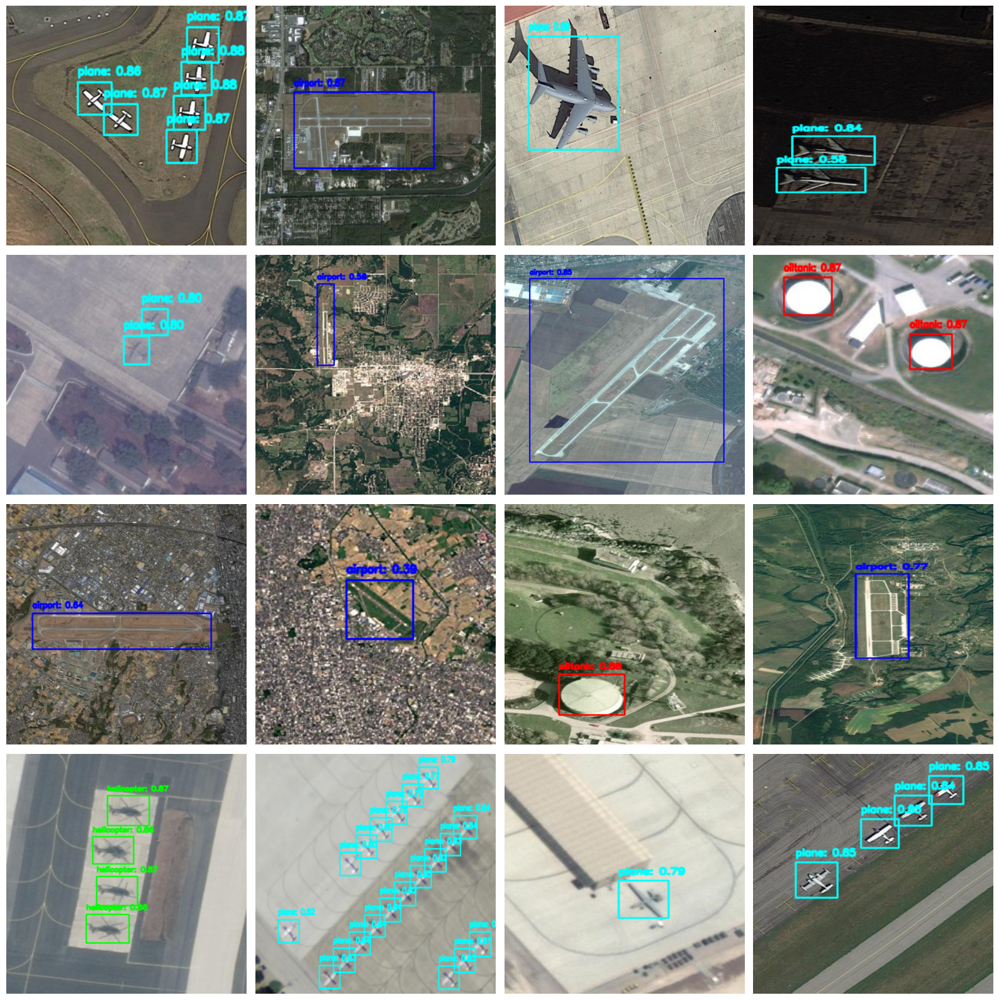

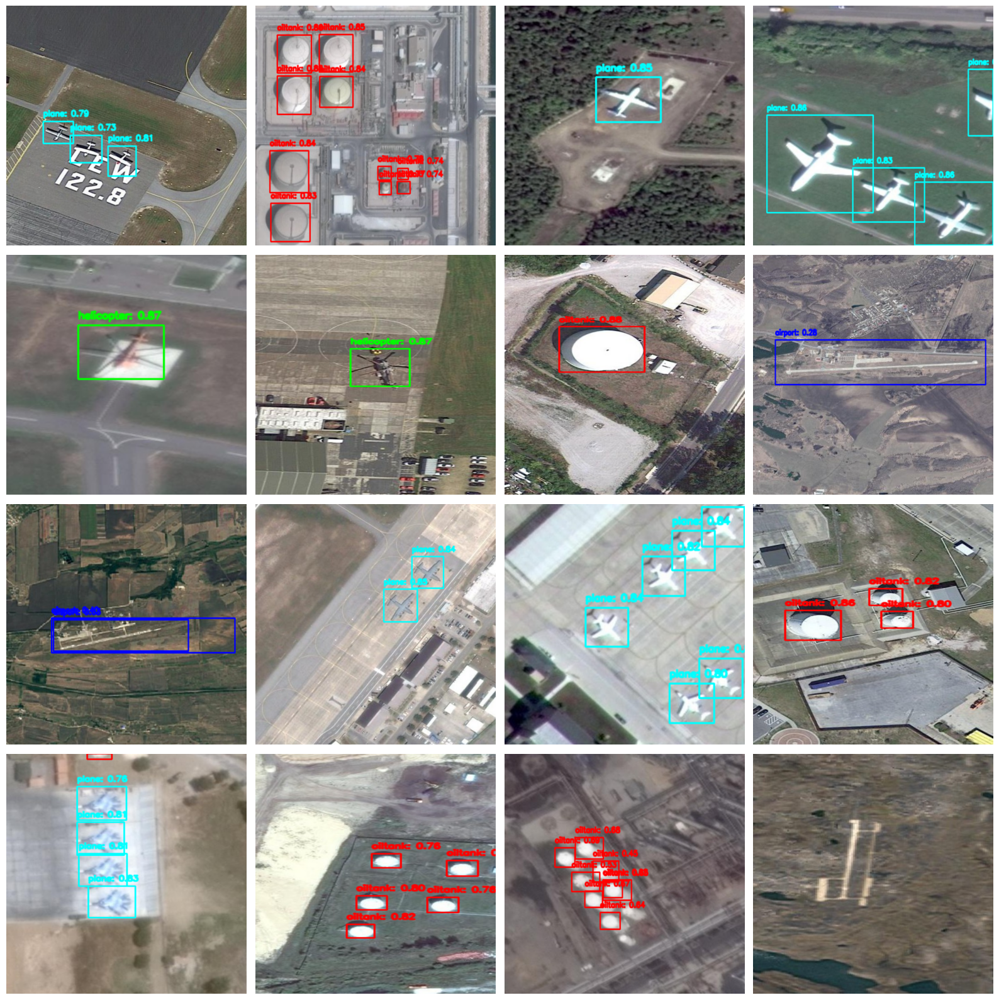

In [ ]:
images_path = Path("D:\\stuff\\datasets\\DOTANA\\DOTANA_no_ships\\test\\images")

show_yolo_predictions_grid("DOTANA_no_ships_yolo12x.pt", images_path)
show_yolo_predictions_grid("DOTANA_no_ships_yolo11x.pt", images_path)


### SHIPS dataset

Best models:
- ships_yolo11l.pt map50_95: 0.7548 
- ships_yolo11s.pt map50_95: 0.7543

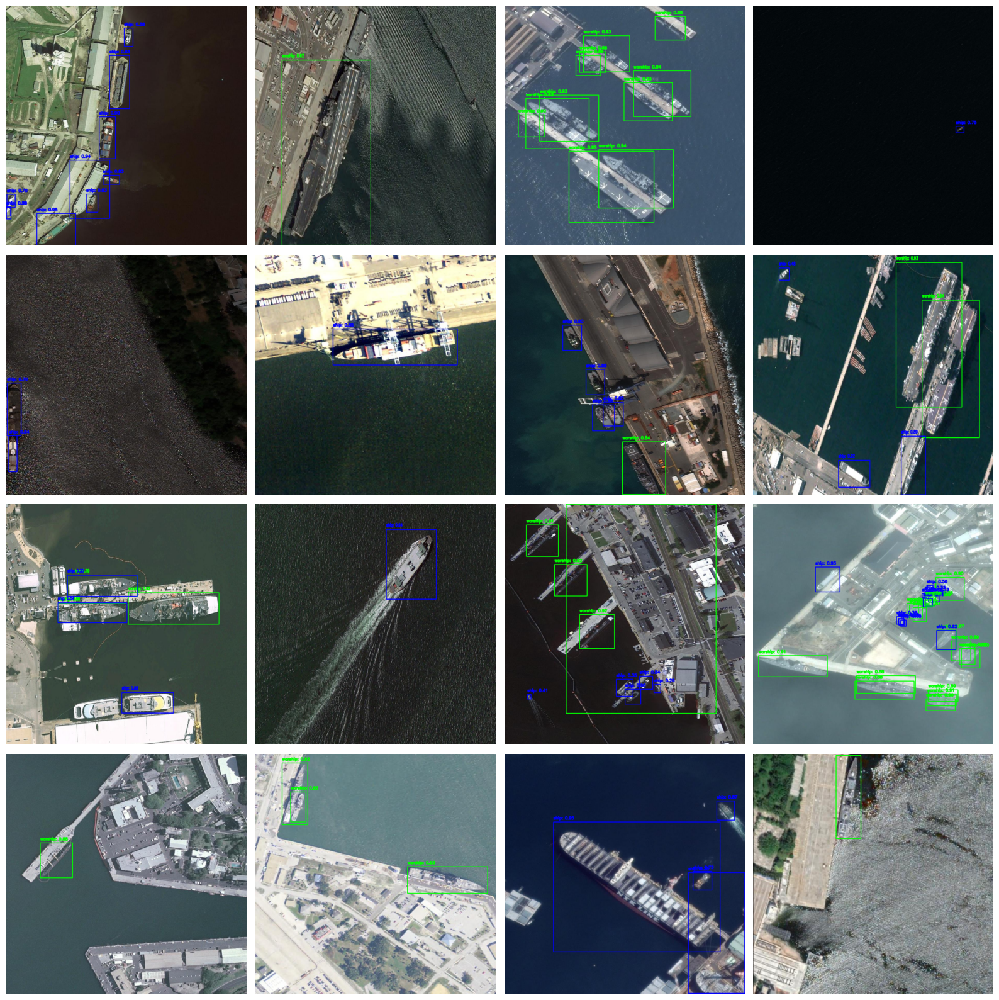

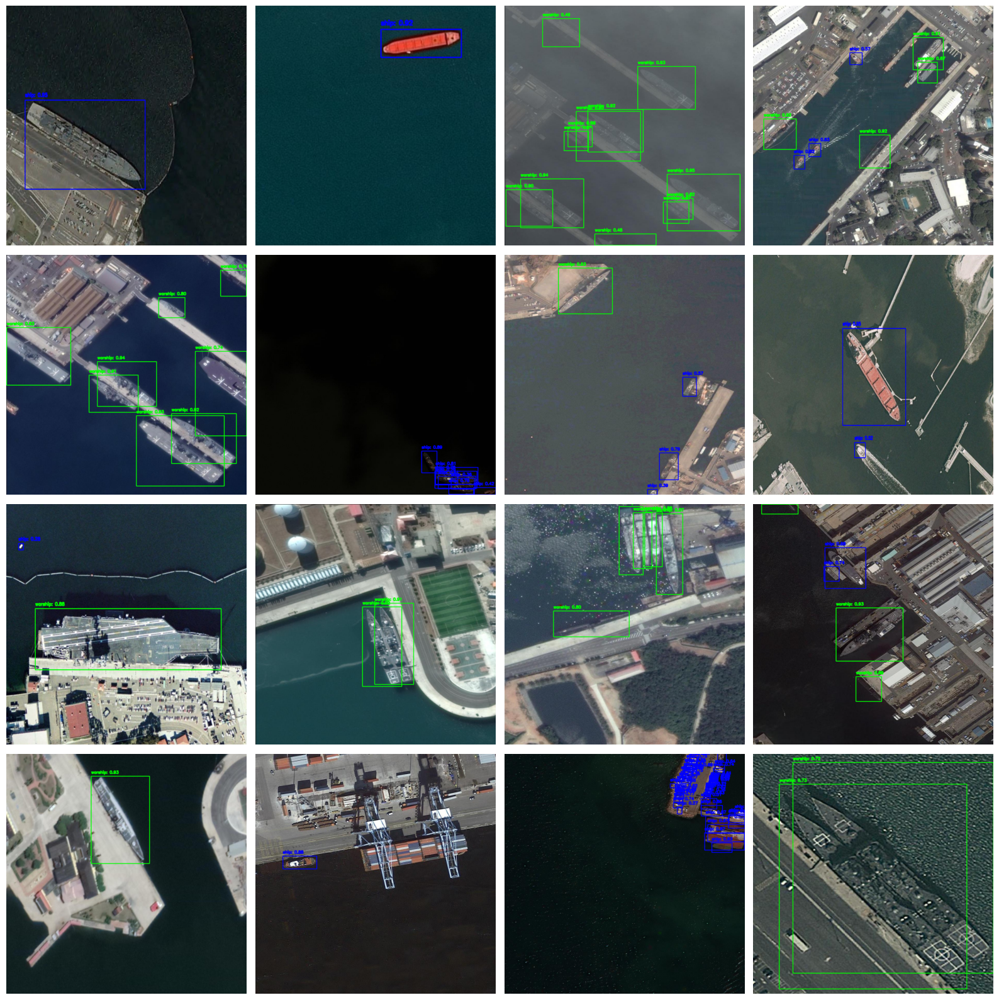

In [ ]:
images_path = Path("D:\\stuff\\datasets\\ShipRSImageNet\\ShipRSImageNet\\test\\images")

show_yolo_predictions_grid("ships_yolo11l.pt", images_path)
show_yolo_predictions_grid("ships_yolo11s.pt", images_path)